^C
Note: you may need to restart the kernel to use updated packages.


In [31]:
import pandas  as pd  
import numpy as np 

import matplotlib.pyplot as plt 
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import warnings
warnings.simplefilter(action='ignore')

plt.rcParams['figure.figsize'] = [8,5] 
plt.rcParams['font.size'] =14 
plt.rcParams['font.weight']= 'bold'
plt.style.use('seaborn-whitegrid') 

In [58]:
import pandas  as pd 
import numpy as np 

import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
 
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score

from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression  
from sklearn.preprocessing import StandardScaler 

import warnings
warnings.simplefilter(action='ignore')

plt.rcParams['figure.figsize'] = [8,5] 
plt.rcParams['font.size'] =14 
plt.rcParams['font.weight']= 'bold'
plt.style.use('seaborn-whitegrid') 

In [32]:
df = pd.read_csv(r'C:\Users\vikrant_rao\Downloads\Data vader project\Car details v3.csv')
print('Number of rows and columns in the data set: ',df.shape)
df.head()

Number of rows and columns in the data set:  (8128, 13)


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [34]:
print('No. of duplicate values:',sum(df.duplicated()))
df = df.drop_duplicates()
df.shape

No. of duplicate values: 1202


(6926, 13)

In [35]:
print ("\nMissing values :  \n", df.isnull().sum())
df.dropna(axis=0, inplace=True)
df.isnull().any()


Missing values :  
 name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          208
engine           208
max_power        205
torque           209
seats            208
dtype: int64


name             False
year             False
selling_price    False
km_driven        False
fuel             False
seller_type      False
transmission     False
owner            False
mileage          False
engine           False
max_power        False
torque           False
seats            False
dtype: bool

In [36]:
df.shape

(6717, 13)

In [37]:
df.describe()

,year,selling_price,km_driven,seats
count,6717.000000,6.717000e+03,6.717000e+03,6717.000000
mean,2013.611136,5.263860e+05,7.339834e+04,5.434271
std,3.897402,5.235504e+05,5.870328e+04,0.983805
min,1994.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.500000e+05,3.800000e+04,5.000000
50%,2014.000000,4.200000e+05,6.820300e+04,5.000000
75%,2017.000000,6.500000e+05,1.000000e+05,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [38]:
df.describe(include=np.object)

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6717,6717,6717,6717,6717,6717,6717,6717,6717
unique,1982,4,3,2,5,393,121,320,441
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,118,3658,6024,6142,4176,210,907,324,472


In [39]:
df['torque'].value_counts()
df.drop(['torque'],axis=1, inplace = True)
df.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,5.0


In [40]:
df['age'] = 2021 - df['year']
# dropping the year column as we have replaced it with age
df.drop(['year'],axis = 1,inplace = True)

# updating the owner to numeric type
df['owner'] = df['owner'].replace({'First Owner': 1, 'Second Owner': 2, 'Third Owner': 3, 'Fourth & Above Owner':4, 'Test Drive Car':5})
df.head()


,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,age
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,1,23.4 kmpl,1248 CC,74 bhp,5.0,7
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,2,21.14 kmpl,1498 CC,103.52 bhp,5.0,7
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,3,17.7 kmpl,1497 CC,78 bhp,5.0,15
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,1,23.0 kmpl,1396 CC,90 bhp,5.0,11
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,1,16.1 kmpl,1298 CC,88.2 bhp,5.0,14


In [41]:
df['mileage'] = df['mileage'].str.strip('kmpl').str.strip('km/kg')
df['engine'] = df['engine'].str.strip('CC')
df['max_power'] = df['max_power'].str.strip('bhp').str.strip()
df.head()

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,age
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,1,23.4,1248,74,5.0,7
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,2,21.14,1498,103.52,5.0,7
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,3,17.7,1497,78,5.0,15
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,1,23.0,1396,90,5.0,11
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,1,16.1,1298,88.2,5.0,14


In [42]:
df['mileage'] = pd.to_numeric(df['mileage'])
df['engine'] = pd.to_numeric(df['engine'])
df['max_power'] = pd.to_numeric(df['max_power'])
df.head()

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,age
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,1,23.40,1248,74.00,5.0,7
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,2,21.14,1498,103.52,5.0,7
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,3,17.70,1497,78.00,5.0,15
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,1,23.00,1396,90.00,5.0,11
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,1,16.10,1298,88.20,5.0,14


In [43]:
df['seats'] = df['seats'].astype(str)
df.head()

,name,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats,age
0,Maruti Swift Dzire VDI,450000,145500,Diesel,Individual,Manual,1,23.40,1248,74.00,5.0,7
1,Skoda Rapid 1.5 TDI Ambition,370000,120000,Diesel,Individual,Manual,2,21.14,1498,103.52,5.0,7
2,Honda City 2017-2020 EXi,158000,140000,Petrol,Individual,Manual,3,17.70,1497,78.00,5.0,15
3,Hyundai i20 Sportz Diesel,225000,127000,Diesel,Individual,Manual,1,23.00,1396,90.00,5.0,11
4,Maruti Swift VXI BSIII,130000,120000,Petrol,Individual,Manual,1,16.10,1298,88.20,5.0,14


In [44]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Histogram of Selling Price in Rupee", 
                                                   "Boxplot Selling Price in Rupee",))
fig.add_trace(go.Histogram(x=df['selling_price'], name="Rupees"),row=1, col=1)
fig.add_trace(go.Box(x=df['selling_price'], name="Rupees"),row=1, col=2)

fig.show()

In [45]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Histogram of KM Driven", 
                                                   "Boxplot KM Driven",))
fig.add_trace(go.Histogram(x=df['km_driven'], name="kms"),row=1, col=1)
fig.add_trace(go.Box(x=df['km_driven'], name="kms"),row=1, col=2)

fig.show()

In [46]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Histogram of mileage", 
                                                   "Boxplot mileage",))
fig.add_trace(go.Histogram(x=df['mileage'], name="km/l"),row=1, col=1)
fig.add_trace(go.Box(x=df['mileage'], name="km/l"),row=1, col=2)

fig.show()

In [47]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Histogram of engine", 
                                                   "Boxplot engine",))
fig.add_trace(go.Histogram(x=df['engine'], name="cc"),row=1, col=1)
fig.add_trace(go.Box(x=df['engine'], name="cc"),row=1, col=2)

fig.show()

In [48]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Histogram of max_power", 
                                                   "Boxplot max_power",))
fig.add_trace(go.Histogram(x=df['max_power'], name="bhp"),row=1, col=1)
fig.add_trace(go.Box(x=df['max_power'], name="bhp"),row=1, col=2)

fig.show()

In [49]:
fig = make_subplots(rows=1, cols=2,subplot_titles=("Histogram of age", 
                                                   "Boxplot age",))
fig.add_trace(go.Histogram(x=df['age'], name="years"),row=1, col=1)
fig.add_trace(go.Box(x=df['age'], name="years"),row=1, col=2)

fig.show()

In [50]:
temp = df['fuel'].value_counts()
fig = go.Figure(go.Bar(y=temp.values, x=temp.index))
fig.update_layout(
    title_text='Distribution of Fuel types', # title of plot
    yaxis_title_text='Number of cars', # xaxis label
    xaxis_title_text='Fuel type' # yaxis label
)
fig.show()

In [52]:
temp = df['seller_type'].value_counts()
fig = go.Figure(go.Bar(y=temp.values, x=temp.index))
fig.update_layout(
    title_text='Distribution of Seller Types', # title of plot
    yaxis_title_text='Number of cars', # xaxis label
    xaxis_title_text='Seller type' # yaxis label
)
fig.show()

In [53]:
temp = df['transmission'].value_counts()
fig = go.Figure(go.Bar(y=temp.values, x=temp.index))
fig.update_layout(
    title_text='Distribution of Transmission Types', # title of plot
    yaxis_title_text='Number of cars', # xaxis label
    xaxis_title_text='Transmission type' # yaxis label
)
fig.show()

In [54]:
temp = df['transmission'].value_counts()
fig = go.Figure(go.Bar(y=temp.values, x=temp.index))
fig.update_layout(
    title_text='Distribution of Transmission Types', # title of plot
    yaxis_title_text='Number of cars', # xaxis label
    xaxis_title_text='Transmission type' # yaxis label
)
fig.show()

In [55]:
temp = df['seats'].value_counts()
fig = go.Figure(go.Bar(y=temp.values, x=temp.index))
fig.update_layout(
    title_text='Distribution of Seats Types', # title of plot
    yaxis_title_text='Number of cars', # xaxis label
    xaxis_title_text='Seats type' # yaxis label
)
fig.show()

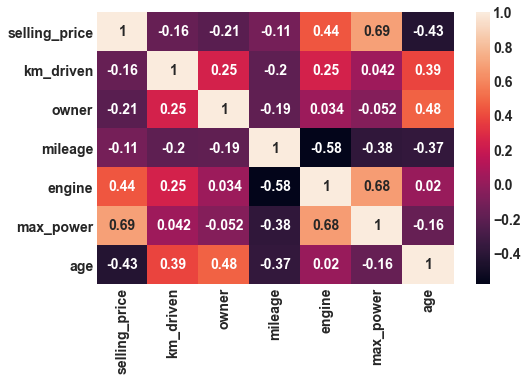

In [56]:
sns.heatmap(df.corr(), annot=True)
plt.show()

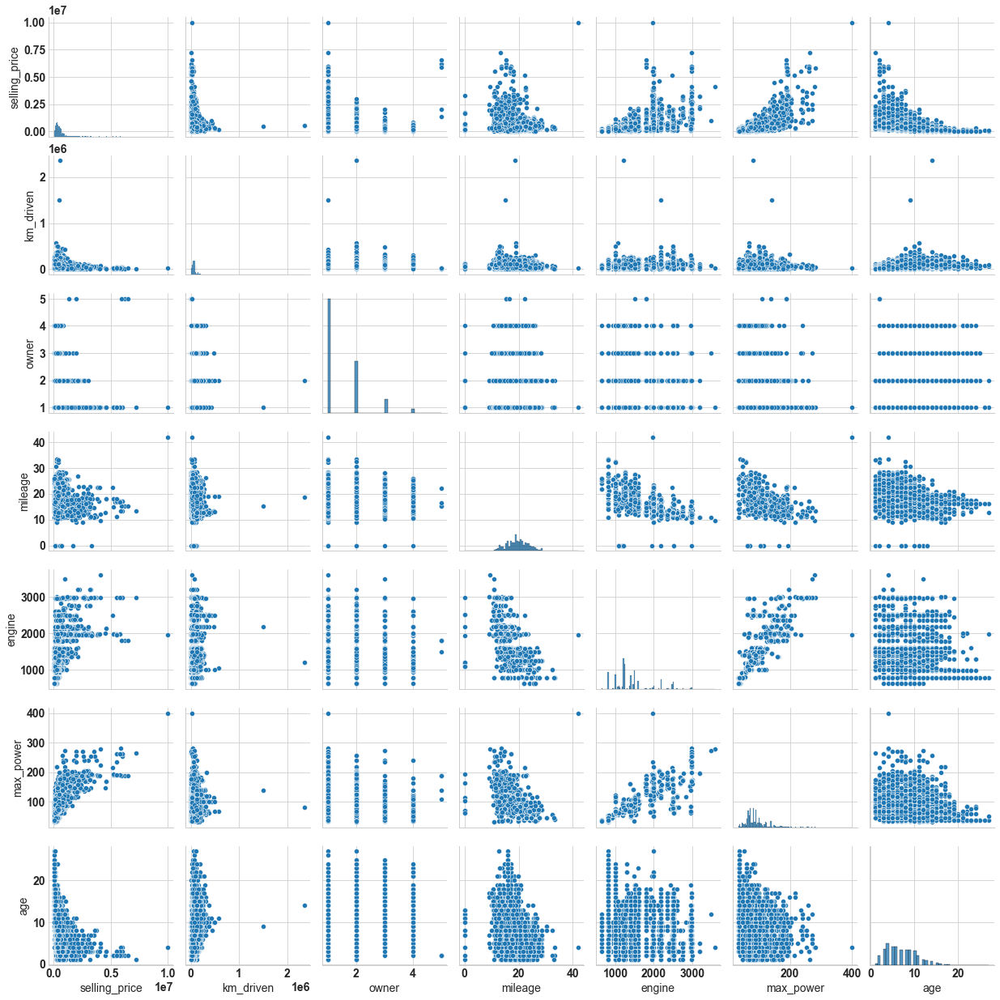

In [57]:
sns.pairplot(df)

In [59]:
def create_model(model, X_train, y_train, X_test, y_test):
    # training the model with the feautures(X_train) and target(y_train)
    model.fit(X_train, y_train)
    
    # R2 score of training set
    y_train_pred = model.predict(X_train)
    r2_train = r2_score(y_train, y_train_pred)
    
    # R2 score of test set
    y_test_pred = model.predict(X_test)
    r2_test = r2_score(y_test, y_test_pred)
    
    # CV(cross validation) score of training set
    cv_training = cross_val_score(model, X_train, y_train, cv=5)
    cv_mean_training = cv_training.mean()
    
    
    
    # Printing each score
    print("Training set R2 scores: ",round(r2_train,2))
    print("Test set R2 scores: ",round(r2_test,2))
    print("Training cross validation score: ", cv_training)
    print("Training cross validation mean score: ",round(cv_mean_training,2))
    
    temp = [(y_train-y_train_pred).values]
    fig = ff.create_distplot(temp,['distplot'], show_hist=False)
    fig.update_layout(title_text="Distribution plot for the Residuals")
    fig.show()

    if(X_train.shape[1]==1):
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=X_train.values.reshape(-1),y=y_train.values, mode='markers',name='Observations'))
        fig.add_trace(go.Scatter(x=X_train.values.reshape(-1),y=y_train_pred, mode='lines',name='Linear Regression'))
        fig.update_layout(title_text="Linear Regression line and actual values")        
        fig.show()
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_test,y=y_test_pred, mode='markers'))
    fig.update_layout(title_text="True Values vs Predictions")        
    fig.show()

In [60]:
any(df.isna())

True

In [63]:
df = df.dropna()

In [64]:
X = df.drop(['selling_price','name'],axis=1)
y = df['selling_price']

In [65]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)
print("x train: ",X_train.shape)
print("x test: ",X_test.shape)
print("y train: ",y_train.shape)
print("y test: ",y_test.shape)

x train:  (5373, 10)
x test:  (1344, 10)
y train:  (5373,)
y test:  (1344,)


In [66]:
lm = LinearRegression()
create_model(lm, X_train[['max_power']], y_train, X_test[['max_power']], y_test)

Training set R2 scores:  0.48
Test set R2 scores:  0.48
Training cross validation score:  [0.49738647 0.43244638 0.46574585 0.48782825 0.48042811]
Training cross validation mean score:  0.47


In [67]:
# training a model with only engine as a feature and chekcing the results
create_model(lm, X_train[['engine']], y_train, X_test[['engine']], y_test)

Training set R2 scores:  0.19
Test set R2 scores:  0.21
Training cross validation score:  [0.23534753 0.19382674 0.18127038 0.20596561 0.14471277]
Training cross validation mean score:  0.19


In [68]:
# training a model with only age as a feature and chekcing the results
create_model(lm, X_train[['age']], y_train, X_test[['age']], y_test)

Training set R2 scores:  0.19
Test set R2 scores:  0.17
Training cross validation score:  [0.1836822  0.23956921 0.19000411 0.18593616 0.14797402]
Training cross validation mean score:  0.19


In [69]:
# training a model with only mileage as a feature and chekcing the results
create_model(lm, X_train[['mileage']], y_train, X_test[['mileage']], y_test)

Training set R2 scores:  0.01
Test set R2 scores:  0.02
Training cross validation score:  [ 0.01509653  0.01018568  0.01002153  0.01383188 -0.01345332]
Training cross validation mean score:  0.01


In [70]:
# Make a copy of the data for modelling
df_model = df.copy()

# Create the 'brand' column by splitting the 'name' column
df_model['brand'] = df_model['name'].str.split(' ').str.get(0)
df_model.drop(['name'],axis=1,inplace=True)

# Filter the outlier and log-transform the target variable('selling_price')
df_model = df_model[df_model['selling_price'] < 2500000]
df_model['selling_price'] = np.log(df_model['selling_price'])

# Filter the outlier in 'km_driven' feature
df_model = df_model[df_model['km_driven'] < 300000]

# Filter the unwanted rows in 'fuel' feature
df_model = df_model[~df_model['fuel'].isin(['CNG','LPG'])]

# Filter the outliers in 'mileage' feature
df_model = df_model[(df_model['mileage'] > 5) & (df_model['mileage'] < 35)]

# Filter the outlier in 'max_power' feature and log-transform the data.
df_model = df_model[df_model['max_power'] < 300]
df_model['max_power'] = np.log(df_model['max_power'])

# Log-transform the 'age' feature data.
df_model['age'] = np.log(df_model['age'])

In [71]:
df_model = pd.get_dummies(data = df_model, drop_first=True)
df_model.head()

,selling_price,km_driven,owner,mileage,engine,max_power,age,fuel_Petrol,seller_type_Individual,seller_type_Trustmark Dealer,...,brand_Mercedes-Benz,brand_Mitsubishi,brand_Nissan,brand_Opel,brand_Renault,brand_Skoda,brand_Tata,brand_Toyota,brand_Volkswagen,brand_Volvo
0,13.017003,145500,1,23.40,1248,4.304065,1.945910,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,12.821258,120000,2,21.14,1498,4.639765,1.945910,0,1,0,...,0,0,0,0,0,1,0,0,0,0
2,11.970350,140000,3,17.70,1497,4.356709,2.708050,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,12.323856,127000,1,23.00,1396,4.499810,2.397895,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,11.775290,120000,1,16.10,1298,4.479607,2.639057,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [72]:
X = df_model.drop(['selling_price'],axis=1)
y = df_model['selling_price']

In [73]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)
print("x train: ",X_train.shape)
print("x test: ",X_test.shape)
print("y train: ",y_train.shape)
print("y test: ",y_test.shape)

x train:  (5204, 46)
x test:  (1301, 46)
y train:  (5204,)
y test:  (1301,)


In [74]:
scaler = StandardScaler()
num_var = ['km_driven', 'mileage', 'engine', 'max_power', 'age']
X_train[num_var] = scaler.fit_transform(X_train[num_var])
X_test[num_var] = scaler.transform(X_test[num_var])

In [75]:
create_model(lm, X_train, y_train, X_test, y_test)

Training set R2 scores:  0.86
Test set R2 scores:  0.85
Training cross validation score:  [0.85684275 0.84834677 0.85283797 0.86353878 0.8388678 ]
Training cross validation mean score:  0.85
